# Square Attack

This notebook demonstrates the **Square Attack** (Andriushchenko et al., 2020) against three pre-trained CNNs: EfficientNetB0, InceptionV3, and MobileNetV2.

Unlike FGSM, PGD, C&W or DeepFool, Square Attack never touches the model's gradients, it is a **score-based black-box attack**: it only ever queries the model for its output probabilities and performs a randomized greedy search over the pixel space. This is the realistic threat model for any API-only deployed model (a fraud-detection endpoint, a content moderation service, a commercial vision API) where an attacker can send images and read back confidence scores, but has no access to the model's weights.


In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Import models
from tensorflow.keras.applications import EfficientNetB0, InceptionV3, MobileNetV2

# Import specific preprocessing and decoding functions
from tensorflow.keras.applications.efficientnet import preprocess_input as preprocess_eff, decode_predictions as decode_eff
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inc, decode_predictions as decode_inc
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_mob, decode_predictions as decode_mob

### Setup Models and Images
We reuse the same `models_dict` / `images_dict` structure as the white-box notebooks. `eps_scale` normalizes the perceptual magnitude of $\varepsilon$ across each model's input range (`[0, 255]` for EfficientNet vs. `[-1, 1]` for MobileNetV2/InceptionV3), following the convention used in `attacks/whitebox/02_PGD.ipynb`.

In [2]:
# Helper functions for denormalization based on model preprocessing
def denormalize_eff(img):
    # EfficientNet uses [0, 255] range
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy().squeeze().astype("uint8")

def denormalize_neg1_1(img):
    # MobileNetV2 and InceptionV3 use [-1, 1] range
    img = (img + 1.0) / 2.0 # Convert to [0, 1]
    img = img * 255.0 # Convert to [0, 255]
    img = tf.clip_by_value(img, 0, 255)
    return img.numpy().squeeze().astype("uint8")

# Dictionary with model configurations
models_dict = {
    'MobileNetV2': {
        'model': MobileNetV2(weights='imagenet'),
        'target_size': (224, 224),
        'preprocess_fn': preprocess_mob,
        'decode_fn': decode_mob,
        'denormalize_fn': denormalize_neg1_1,
        'clip_min': -1.0,
        'clip_max': 1.0,
        'eps_scale': 1.0
    },
    'EfficientNetB0': {
        'model': EfficientNetB0(weights='imagenet'),
        'target_size': (224, 224),
        'preprocess_fn': preprocess_eff,
        'decode_fn': decode_eff,
        'denormalize_fn': denormalize_eff,
        'clip_min': 0.0,
        'clip_max': 255.0,
        'eps_scale': 127.5
    },
    'InceptionV3': {
        'model': InceptionV3(weights='imagenet'),
        'target_size': (299, 299),
        'preprocess_fn': preprocess_inc,
        'decode_fn': decode_inc,
        'denormalize_fn': denormalize_neg1_1,
        'clip_min': -1.0,
        'clip_max': 1.0,
        'eps_scale': 1.0
    }
}

# Freeze weights - black-box attacks never use gradients, but we keep this
# for consistency with the rest of the repo and to speed up inference.
for config in models_dict.values():
    config['model'].trainable = False

# Dictionary for target images
images_dict = {
    'Dog': '../../images/dog.png',
    'Lion': '../../images/lion.png'
}

In [3]:
def load_and_preprocess_image(img_path, target_size, preprocess_fn):
    img_raw = tf.io.read_file(img_path)
    img = tf.image.decode_image(img_raw, channels=3)
    img = tf.cast(img, tf.float32)
    img = tf.image.resize(img, target_size)
    img = preprocess_fn(img) # Dynamic preprocessing
    img = tf.expand_dims(img, axis=0) # Add batch dimension
    return img

def get_imagenet_label(prob, decode_fn):
    return decode_fn(prob, top=1)[0][0]

def get_imagenet_class_index(prob):
    return int(tf.argmax(prob, axis=-1).numpy()[0])

def euclidean_distance(img1, img2):
    return np.linalg.norm(np.array(img1) - np.array(img2))

### Square Attack Algorithm
Square Attack performs a randomized search: at each step it samples a small **square-shaped** region of the image and assigns it a random value at the border of the $L_\infty$ ball, $\pm\varepsilon$. The candidate perturbation is only kept if it decreases the **untargeted margin loss**:
$$L(x) = p_y(x) - \max_{k \neq y} p_k(x)$$
where $p_y$ is the predicted probability of the true class $y$. The attack succeeds once $L(x) < 0$, i.e. once some other class outscores the true one. The square side length shrinks as the query budget is consumed, moving from coarse, large perturbations to fine-grained ones.

In [4]:
def margin_loss(probs, true_idx):
    """Untargeted margin loss: true class probability minus the best competing class probability.
    The attack succeeds once this becomes negative (misclassification)."""
    probs = np.array(probs).flatten()
    true_prob = probs[true_idx]
    other_probs = probs.copy()
    other_probs[true_idx] = -1.0
    return float(true_prob - other_probs.max())

def square_attack(input_image, true_idx, current_model, epsilon, clip_min, clip_max, query_budget=1000, p_init=0.2):
    """Score-based black-box attack (Andriushchenko et al., 2020). Greedily accepts random
    square-shaped L_inf perturbations that reduce the margin loss, using only the model's
    predicted probabilities - never its gradients."""
    _, h, w, c = input_image.shape

    # Init: vertical stripes at +/- epsilon, as proposed in the original paper
    init_noise = np.random.choice([-epsilon, epsilon], size=(1, 1, w, c))
    init_noise = np.tile(init_noise, (1, h, 1, 1))
    adv_image = tf.clip_by_value(input_image + init_noise, clip_min, clip_max)

    best_loss = margin_loss(current_model(adv_image, training=False), true_idx)
    queries_used = 1

    for i in range(query_budget - 1):
        if best_loss < 0: # Already misclassified - stop spending queries
            break

        # Shrink the square side length as the query budget is consumed
        p = p_init * max(1 - i / query_budget, 0.05)
        side = max(int(round(np.sqrt(p * h * w))), 1)
        row = np.random.randint(0, h - side + 1)
        col = np.random.randint(0, w - side + 1)

        candidate = adv_image.numpy().copy()
        patch_val = np.random.choice([-epsilon, epsilon], size=(1, side, side, c))
        candidate[:, row:row + side, col:col + side, :] = np.clip(
            input_image.numpy()[:, row:row + side, col:col + side, :] + patch_val, clip_min, clip_max
        )
        candidate = tf.convert_to_tensor(candidate, dtype=tf.float32)

        candidate_loss = margin_loss(current_model(candidate, training=False), true_idx)
        queries_used += 1

        # Greedy acceptance: keep the change only if it reduces the margin loss
        if candidate_loss < best_loss:
            adv_image = candidate
            best_loss = candidate_loss

    return adv_image, queries_used

### Evaluation Loop
Instead of sweeping $\varepsilon$ (fixed here at $\varepsilon=0.05 \times$ `eps_scale`), we sweep the **query budget**, the number of times the attack is allowed to query the model. This is the metric that actually matters for a black-box attacker, whose cost is measured in API calls, not in gradient steps.


EXECUTING SQUARE ATTACKS ON MODEL: MobileNetV2

--- Target Image: Dog ---


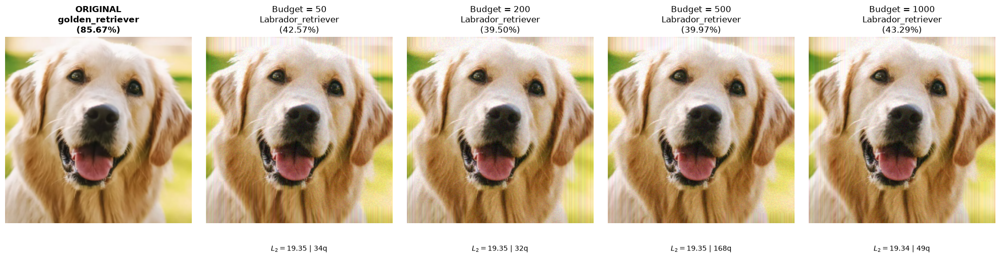

--- Target Image: Lion ---


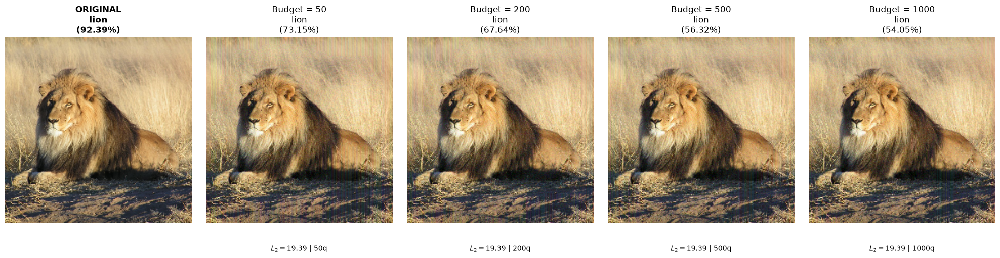


EXECUTING SQUARE ATTACKS ON MODEL: EfficientNetB0

--- Target Image: Dog ---


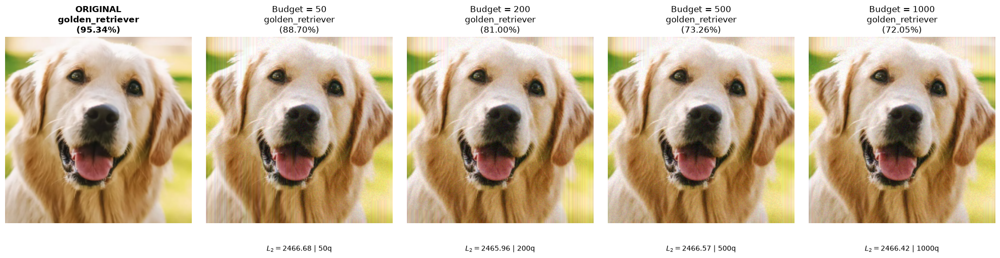

--- Target Image: Lion ---


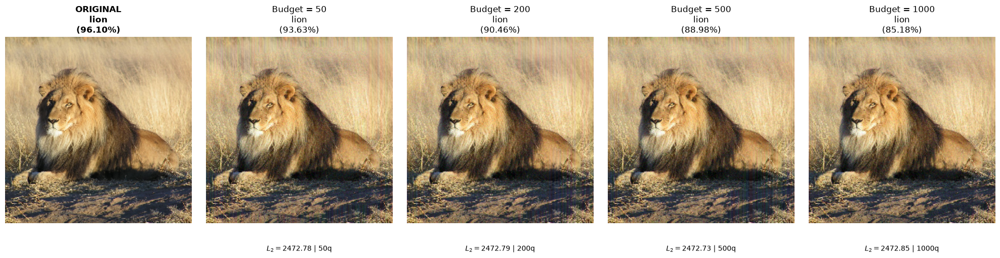


EXECUTING SQUARE ATTACKS ON MODEL: InceptionV3

--- Target Image: Dog ---


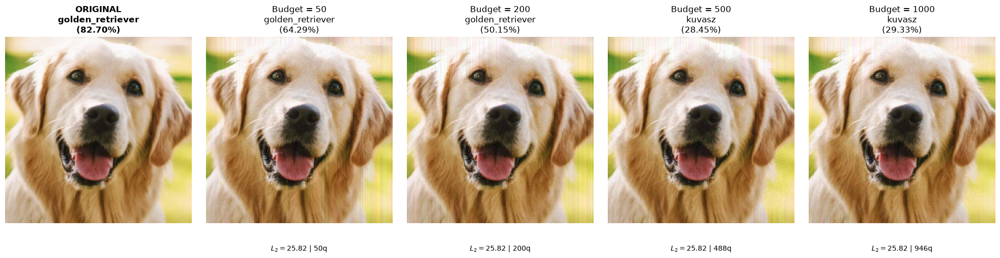

--- Target Image: Lion ---


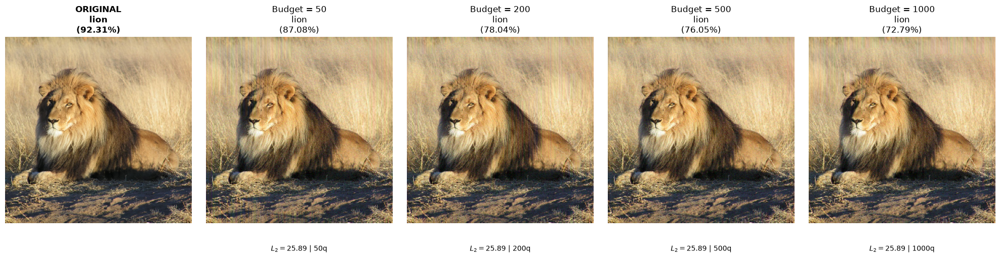

In [5]:
query_budgets = [50, 200, 500, 1000]  # dropped 2000 to keep the 3-model x 2-image sweep tractable on CPU
num_cols = len(query_budgets) + 1 # +1 to include the original image as a baseline
BASE_EPSILON = 0.05

for model_name, m_config in models_dict.items():
    # Print a clear header when switching models
    print(f"\n{'='*80}")
    print(f"EXECUTING SQUARE ATTACKS ON MODEL: {model_name}")
    print(f"{'='*80}\n")

    current_model = m_config['model']
    target_size = m_config['target_size']
    preprocess_fn = m_config['preprocess_fn']
    decode_fn = m_config['decode_fn']
    denormalize_fn = m_config['denormalize_fn'] # Dynamic denormalization function
    clip_min = m_config['clip_min']
    clip_max = m_config['clip_max']

    for img_name, img_path in images_dict.items():
        print(f"--- Target Image: {img_name} ---")

        # Create a new figure for this specific model and image
        fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4.5))
        fig.subplots_adjust(wspace=0.1)

        # Load and Preprocess
        input_img = load_and_preprocess_image(img_path, target_size, preprocess_fn)

        # Get Original Prediction
        original_probs = current_model.predict(input_img, verbose=0)
        _, orig_class_name, orig_prob = get_imagenet_label(original_probs, decode_fn)
        true_idx = get_imagenet_class_index(original_probs)

        # Plot Original Image in the first column
        ax_orig = axes[0]
        ax_orig.imshow(denormalize_fn(input_img)) # Apply specific denormalization
        ax_orig.set_title(f'ORIGINAL\n{orig_class_name}\n({orig_prob * 100:.2f}%)', fontweight='bold')
        ax_orig.axis('off')

        # Iterate over query budgets
        for col_idx, query_budget in enumerate(query_budgets, start=1):
            # Execute Square Attack
            eps = BASE_EPSILON * m_config['eps_scale']
            adv_img, queries_used = square_attack(input_img, true_idx, current_model, eps, clip_min, clip_max, query_budget=query_budget)

            # Calculate L2 Distance
            l2 = euclidean_distance(input_img, adv_img)

            # Get Adversarial Prediction
            adv_img_probs = current_model.predict(adv_img, verbose=0)
            _, adv_img_class, adv_class_prob = get_imagenet_label(adv_img_probs, decode_fn)

            # Plot Adversarial Image
            ax = axes[col_idx]
            ax.imshow(denormalize_fn(adv_img))
            ax.set_title(f'Budget = {query_budget}\n{adv_img_class}\n({adv_class_prob * 100:.2f}%)')
            ax.text(0.5, -0.15, f'$L_2={l2:.2f}$ | {queries_used}q', transform=ax.transAxes, ha='center', fontsize=10)
            ax.axis('off')

        plt.tight_layout()
        plt.show()